In [3]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
from random import randint
import librosa
import librosa.display
import IPython.display as ipd
from IPython.display  import Audio
from sklearn import preprocessing
import seaborn as sns
import missingno as msno

In [5]:
cancion_jazz = "./data/TakeFive_Jazz.mp3"
samples, sr = librosa.load(cancion_jazz, sr = None, mono = True, offset = 0.0, duration = None)

In [6]:
Audio(cancion_jazz)

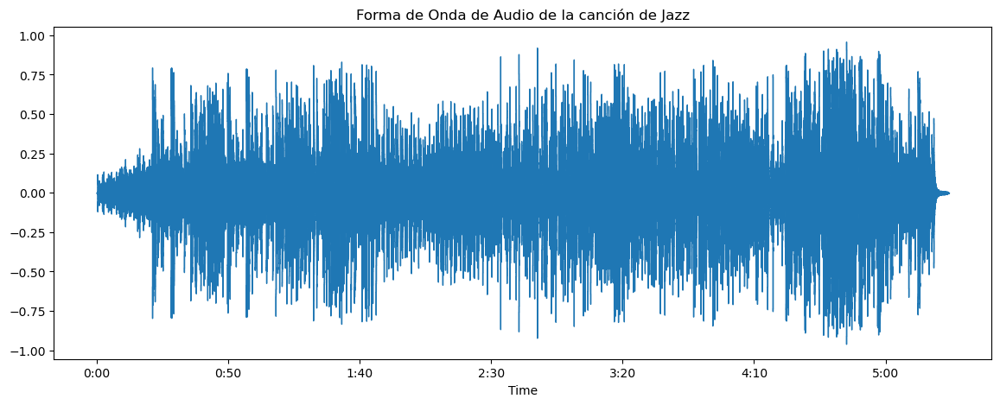

In [7]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(samples, sr=sr)
plt.title("Forma de Onda de Audio de la canción de Jazz")
plt.show()

Text(0.5, 1.0, 'Canción de Jazz')

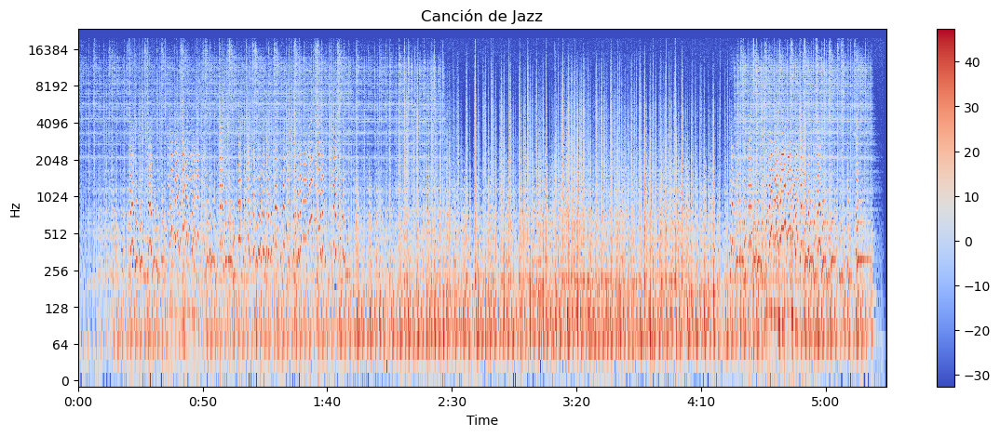

In [8]:
X = librosa.stft(samples)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Canción de Jazz")

## Cero-crossing rate

Text(0.5, 1.0, 'Canción Jazz')

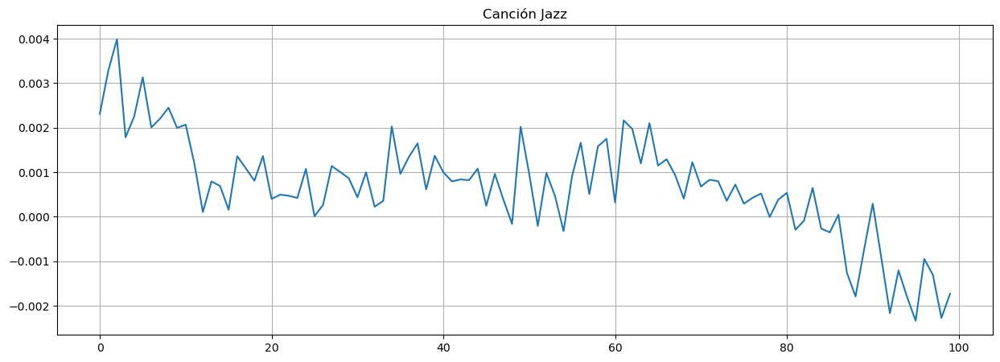

In [9]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(15, 5))
plt.plot(samples[n0:n1])
plt.grid()
plt.title("Canción Jazz")

In [30]:
# Para calcular la cantidad de cruces con 0
zero_crossings= librosa.zero_crossings(samples[n0:n1], pad=False)
zero_c=np.mean(zero_crossings)
print(np.mean(zero_crossings))
print(sum(zero_crossings))

samples

0.15
15


array([ 0.0000000e+00, -1.1617665e-13, -3.4256032e-13, ...,
        3.6383017e-07,  4.5054821e-07, -8.6318181e-08], dtype=float32)

In [15]:
#spectral centroid, calcula el CENTROIDE ESPECTRAL para cada cuadro de la señal
# El centroide espectral es una medida que indica 
#en qué frecuencia promedio se concentra 
#la energía espectral en ese segmento.

spectral_centroids = librosa.feature.spectral_centroid(y=samples, sr=sr)[0]
spectral_centroids.shape
spec_centroid = np.mean(spectral_centroids)
print(spec_centroid)

3209.910318313888


Text(0.5, 1.0, 'Centroide espectral')

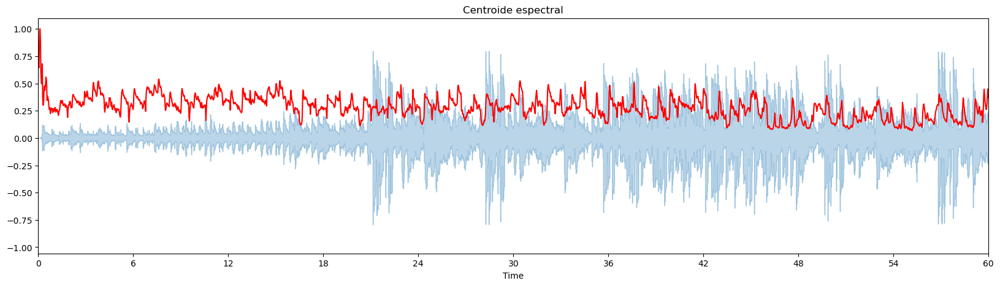

In [17]:
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

def normalize(x, axis = 0):
    return preprocessing.minmax_scale(x, axis = axis)

ax =plt.figure(figsize=(20, 5))
librosa.display.waveshow(samples, sr=sr, alpha=0.3)
plt.plot(t, normalize(spectral_centroids), color='r')
plt.xlim(0,60)
plt.title("Centroide espectral")

7008.909144565825


Text(0.5, 1.0, 'Caída espectral')

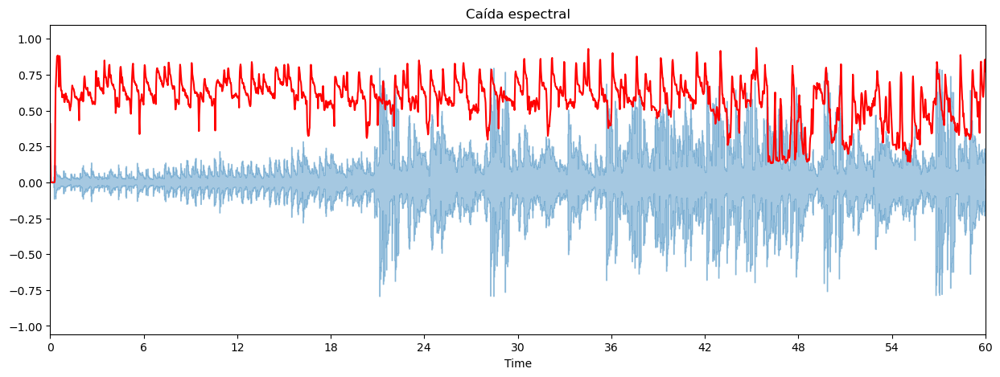

In [18]:
#CAÍDA ESPECTRAL
# El rolloff espectral es una característica que representa la frecuencia 
#por debajo de la cual se encuentra un cierto porcentaje 
#(generalmente el 85%) de la energía espectral. 
#spr = librosa.feature.spectral_rolloff(samples_reggae+0.01, sr = sr_reggae)

spr = librosa.feature.spectral_rolloff(y=samples + 0.01, sr=sr)[0]
spec_rollof = np.mean(spr)
print(spec_rollof)
plt.figure(figsize=(15, 5))
librosa.display.waveshow(samples, sr = sr, alpha = 0.4)
plt.plot(t, normalize(spr), color = 'r')
plt.xlim(0,60)
plt.title("Caída espectral")

Text(0.5, 1.0, 'MFCCs')

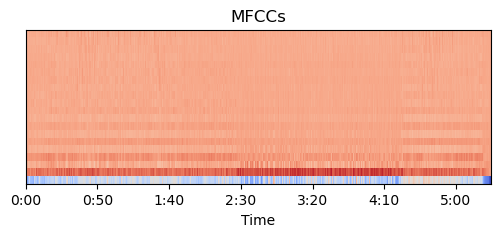

In [19]:
#MFCC
mfccs = librosa.feature.mfcc(y = samples, sr = sr)
mfccs.shape

#20 MFCC en 5626 cuadros (matriz 20x5626)

plt.figure(figsize=(6, 2))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
plt.title("MFCCs")

0.5001635


Text(0.5, 1.0, 'Cromática')

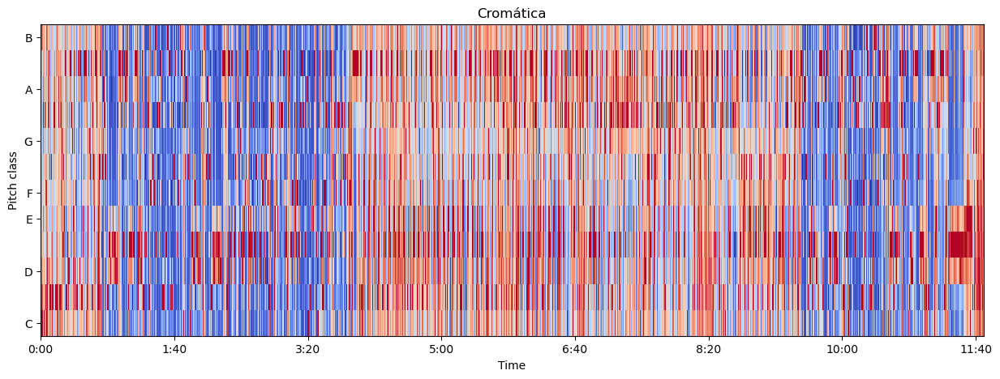

In [20]:
#Chroma frequencies: representación de la escala cromática en 12 semitonos

#El cromagrama es una representación que muestra 
#la intensidad de cada nota musical a lo largo del tiempo.

# El valor de 'salto' es la cantidad de muestras 
#que se saltarán entre los cálculos de las características.

salto = 512


cromatica = librosa.feature.chroma_stft(y=samples, sr=sr, hop_length=salto)
croma = np.mean(cromatica)
print(croma)
plt.figure(figsize=(15, 5))

#El resultado es una representación cromática de la señal de audio.

librosa.display.specshow(cromatica, x_axis='time', y_axis='chroma', hop_length=salto, cmap='coolwarm')
plt.title("Cromática")

In [23]:
%%time
#Temmpograma
hop_length = 512
env = librosa.onset.onset_strength(y = samples, sr = sr, hop_length = hop_length)
tempograma = librosa.feature.tempogram(onset_envelope = env, sr = sr, hop_length = hop_length)

#el onset envelope resalta los momentos 
#en los que comienzan las notas, golpes u 
#otros eventos importantes en la música

auto_c = librosa.autocorrelate(env, max_size = tempograma.shape[0])
auto_c = librosa.util.normalize(auto_c)
autocorr = np.mean(auto_c)
#mostrar los "beats"
tempo = librosa.beat.tempo(onset_envelope = env, sr = sr, hop_length = hop_length)[0]
print(tempo)

print(autocorr)

<timed exec>:14: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.


125.0
0.5275027863351056
CPU times: total: 10.4 s
Wall time: 9.98 s


"\nfreqs = librosa.tempo_frequencies(tempograma.shape[0], hop_length=hop_length, sr=sr_reggae)\n\nax[3].semilogx(freqs[1:], np.mean(tempograma[1:], axis=1),label='Media local de autocorrelación', basex=2)\nax[3].semilogx(freqs[1:], auto_c[1:], '--', alpha=0.75,label='autocorrelación global', basex=2)\nax[3].axvline(tempo, color='black', linestyle='--', alpha=.8,label='Temmmpo estimado={:g}'.format(tempo))\nax[3].legend(frameon=True)\nax[3].set(xlabel='BPM')\nax[3].grid(True)\n"

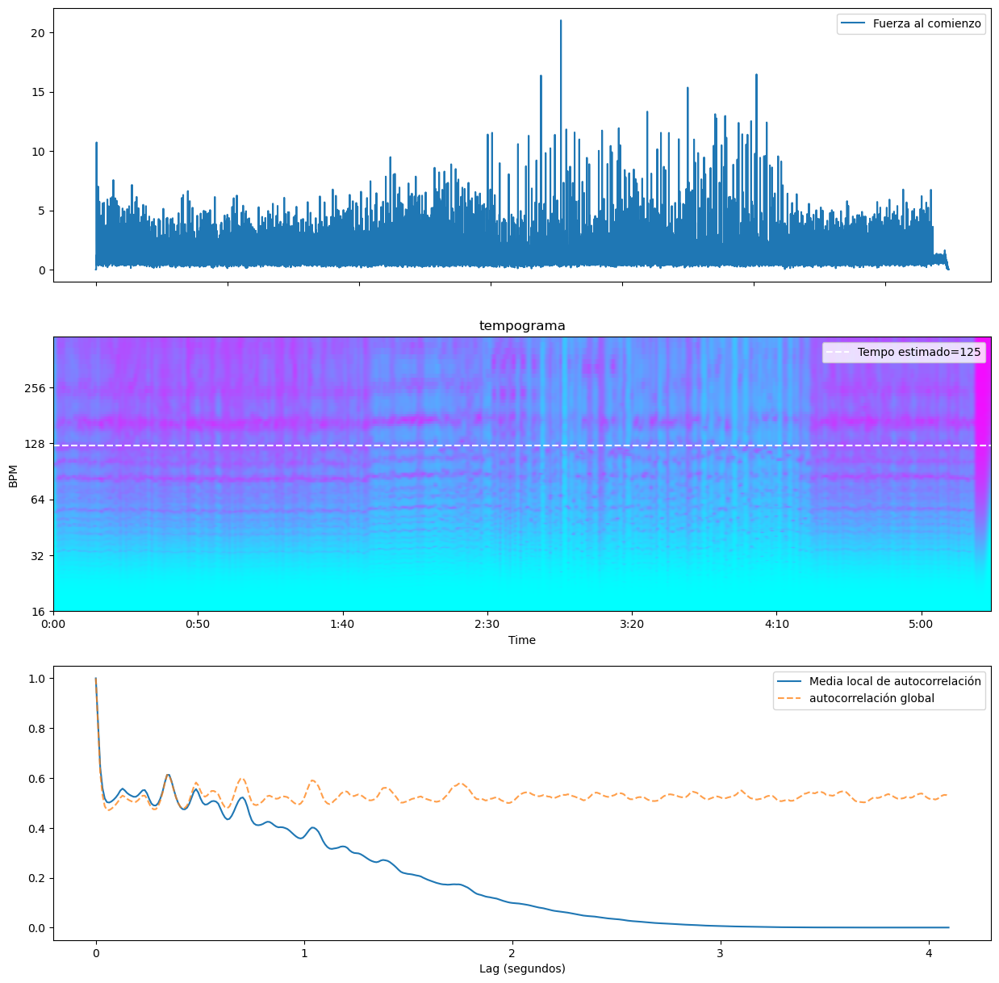

In [26]:
fig, ax = plt.subplots(nrows=3, figsize=(15, 15))
tiempos = librosa.times_like(env, sr=sr, hop_length=hop_length)

ax[0].plot(tiempos, env, label='Fuerza al comienzo')
ax[0].label_outer()
ax[0].legend(frameon=True)

#proporciona un arreglo de tiempos que corresponde 
#a la frecuencia de cálculo del onset envelope

librosa.display.specshow(tempograma, sr=sr, hop_length=hop_length,x_axis='time', y_axis='tempo', cmap='cool',ax=ax[1])

ax[1].axhline(tempo, color='w', linestyle='--', alpha=1,label='Tempo estimado={:g}'.format(tempo))
ax[1].legend(loc='upper right')
ax[1].set(title='tempograma')


x = np.linspace(0, tempograma.shape[0] * float(hop_length) / sr,num=tempograma.shape[0])

ax[2].plot(x, np.mean(tempograma, axis=1), label='Media local de autocorrelación')
ax[2].plot(x, auto_c, '--', alpha=0.75, label='autocorrelación global')
ax[2].set(xlabel='Lag (segundos)')
ax[2].legend(frameon=True)

"""
freqs = librosa.tempo_frequencies(tempograma.shape[0], hop_length=hop_length, sr=sr_reggae)

ax[3].semilogx(freqs[1:], np.mean(tempograma[1:], axis=1),label='Media local de autocorrelación', basex=2)
ax[3].semilogx(freqs[1:], auto_c[1:], '--', alpha=0.75,label='autocorrelación global', basex=2)
ax[3].axvline(tempo, color='black', linestyle='--', alpha=.8,label='Temmmpo estimado={:g}'.format(tempo))
ax[3].legend(frameon=True)
ax[3].set(xlabel='BPM')
ax[3].grid(True)
"""

In [31]:
#DATAFRAME CON LAS VARIABLES OBTENIDAS POR LA CANCION

columnas = ['archivo', 'zero_cr', 'spectral_centroid', 'spectral_rf', 'croma', 'BPM', 'auto_c']
for x in range(1, 21):
    columnas.append(f'mfcc_{x}')

df = pd.DataFrame(columns=columnas)

#Fila de datos
x = [cancion_jazz, zero_c,spec_centroid,spec_rollof, croma, tempo, autocorr]
x.extend([np.mean(m) for m in mfccs])
print(x)
df.loc[len(df)] = x
df.head()

['./data/TakeFive_Jazz.mp3', 0.15, 3209.910318313888, 7008.909144565825, 0.5001635, 125.0, 0.5275027863351056, -224.0295, 128.7881, 4.6787233, 41.58926, -3.3242912, 23.243975, -4.074878, 13.334559, -6.0244966, 6.9464254, 0.9190109, 1.8938291, -0.3364974, 3.5027564, 1.2731514, 2.4372897, -2.4177501, -0.7655665, -1.9497591, 1.5649023]


,archivo,zero_cr,spectral_centroid,spectral_rf,croma,BPM,auto_c,mfcc_1,mfcc_2,mfcc_3,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
0,./data/TakeFive_Jazz.mp3,0.15,3209.910318,7008.909145,0.500163,125.0,0.527503,-224.029495,128.788101,4.678723,...,0.919011,1.893829,-0.336497,3.502756,1.273151,2.43729,-2.41775,-0.765567,-1.949759,1.564902
